In [28]:
import cv2
import numpy as np
import IPython
import math

In [3]:
def show(img):
    # Save the image to a temporary byte buffer
    is_success, buffer = cv2.imencode(".png", img)
    
    if is_success:
        # Display the image using IPython's display function
        IPython.display.display(IPython.display.Image(data=buffer.tobytes()))
    else:
        print("Error encoding image for display.")

In [4]:
framepaths=[f"G:\\My Drive\\School\\2025 _Spring\\EE 497\\Frame-by-frame demo 01\\0{i}.png" for i in range(1,4) ]

https://stackoverflow.com/questions/56183201/detect-and-visualize-differences-between-two-images-with-opencv-python

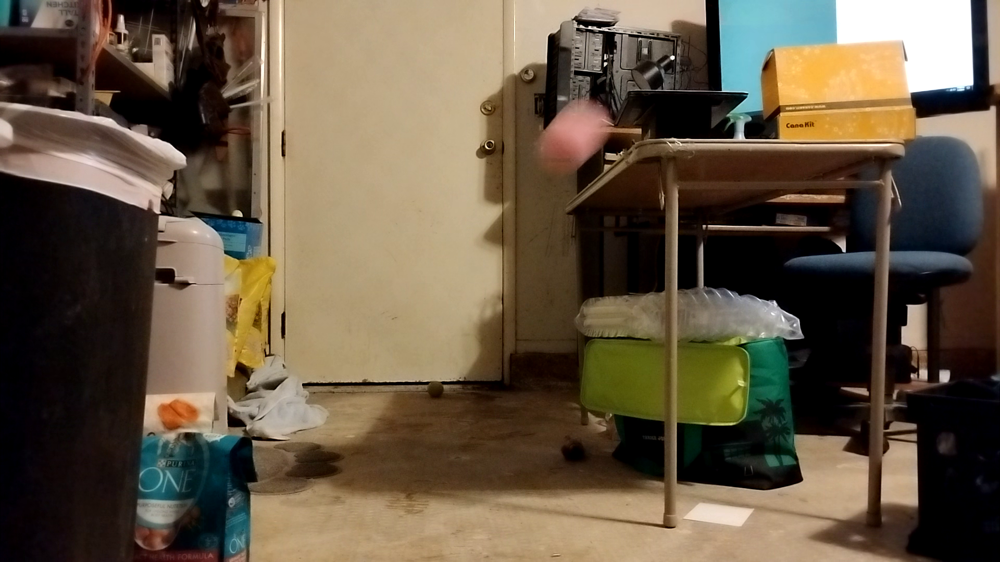

In [8]:
import cv2
import numpy as np

# Load two images for difference calculation
img1 = cv2.imread( framepaths[0] )
img2 = cv2.imread( framepaths[1] )
img3 = cv2.imread( framepaths[2] )

show(img1)
#show(img2)
#show(img3)

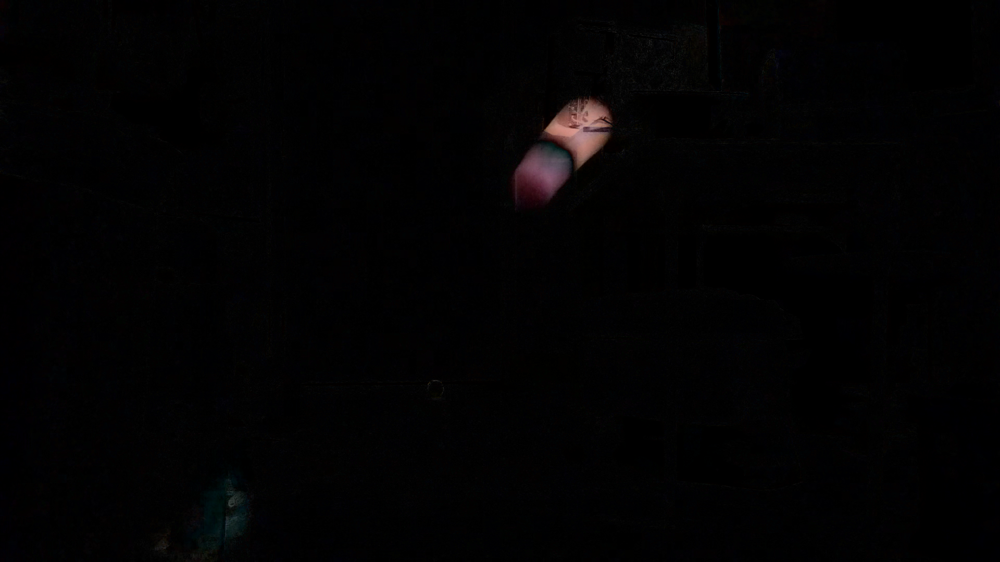

In [10]:
# Calculate the absolute difference
diff12 = cv2.absdiff(img1, img2)
diff23 = cv2.absdiff(img2, img3)
diff13 = cv2.absdiff(img1, img3)

show(diff12)
#show(diff23)
#show(diff13)

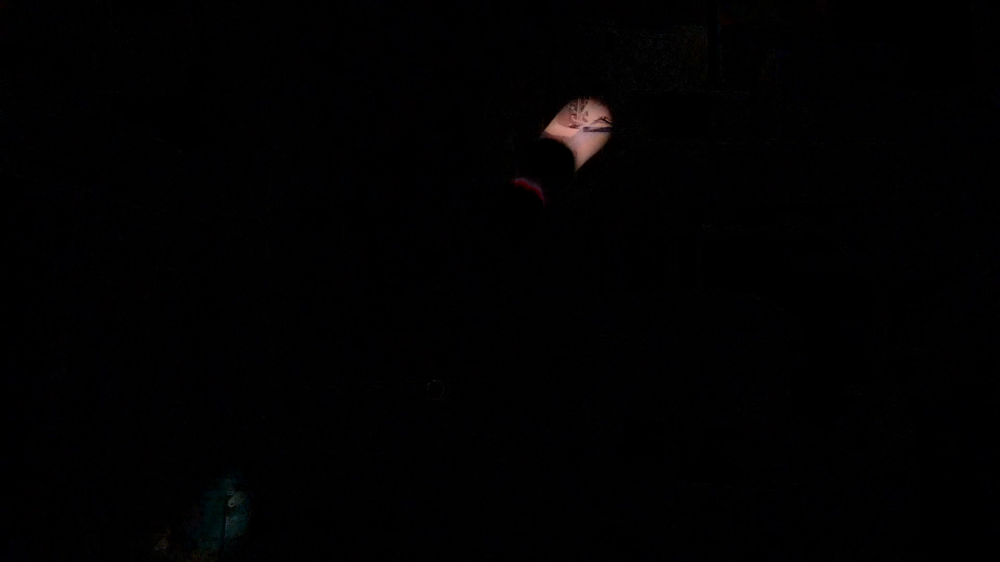

In [12]:
# subtract diff of other two frames from diff involving frame of interest 
sub22 = cv2.subtract(diff12, diff23)

show(sub22)

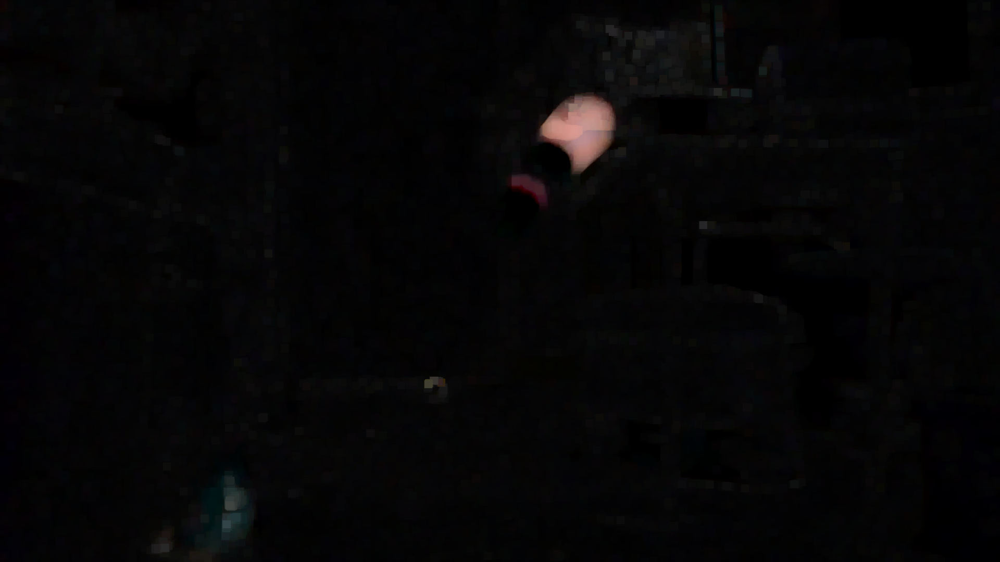

In [14]:
# Dilate the image
size=15
kernel_dilate = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))

image = cv2.dilate(sub22, kernel_dilate, iterations=1)

show(image)

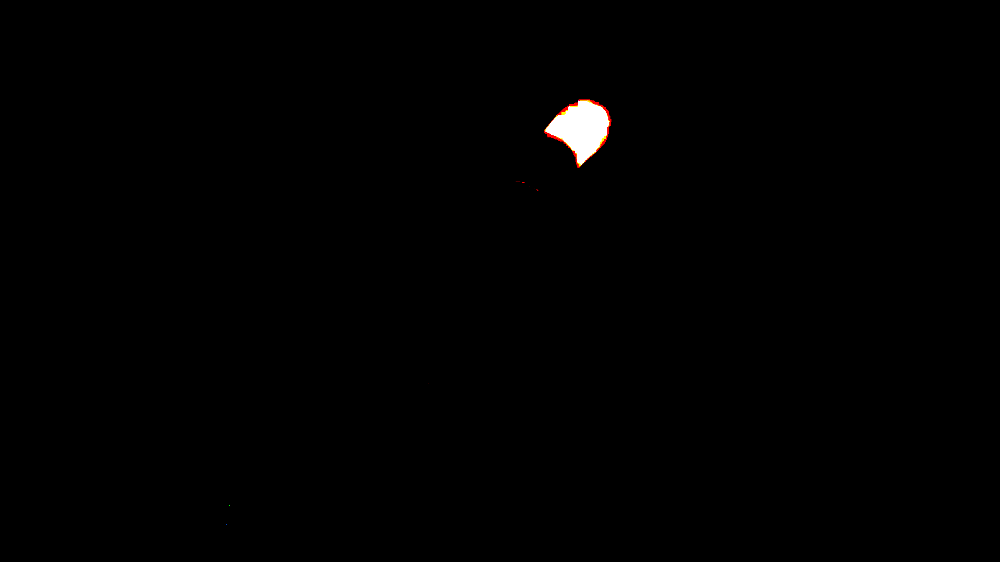

In [16]:
# Apply Threshold to the image
ret, image = cv2.threshold(image, 64, 255, cv2.THRESH_BINARY)
image = cv2.erode(image, kernel_dilate, iterations=1)
show(image)


In [46]:
grey_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
contours, hierarchy = cv2.findContours(grey_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

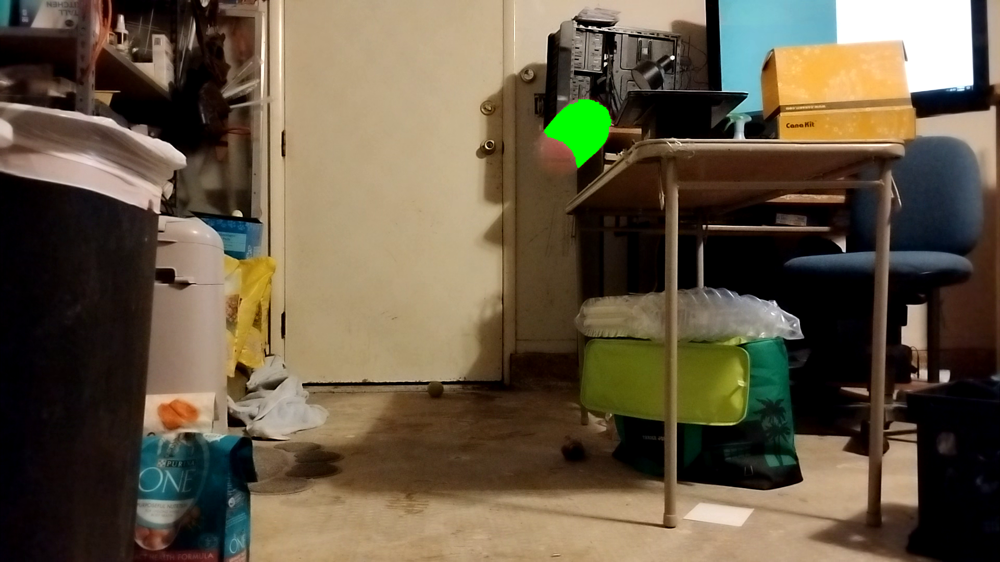

In [60]:
# find contours and isolate the one with the greatest moment

greatest_counter, greatest_moment = sorted( 
    [ [ contour, cv2.moments(contour) ] for contour in contours ],
    key=lambda x: x[1]['m00']
)[-1]

contour_image = img1.copy()
contour_image = cv2.drawContours(contour_image, [greatest_counter], -1, (0, 255, 0), -1)
show(contour_image)

In [22]:
def pixels_to_angle(pixels): # outputs in degrees
    theta =  ( 2 * math.atan(4.25/11) ) * ( pixels / 671.0410824679549 )
    return theta

In [54]:
# find center of mass

pixel_area = greatest_moment['m00']
alpha_x,alpha_y = greatest_moment['m10']/pixel_area - 1920/2, 1080/2 - greatest_moment['m01']/pixel_area
print("alpha measures the angle up and right of straight forward")
print(f"alpha_xy (pixels): ({alpha_x:.2f},{alpha_y:.2f})")
print(f"alpha_xy (radians): ({pixels_to_angle(alpha_x):.2f},{pixels_to_angle(alpha_y):.2f})")
print(f"alpha_xy (degrees): ({pixels_to_angle(alpha_x)/math.pi*180:.2f},{pixels_to_angle(alpha_y)/math.pi*180:.2f})")

alpha measures the angle up and right of straight forward
alpha_xy (pixels): (156.00,293.44)
alpha_xy (radians): (0.17,0.32)
alpha_xy (degrees): (9.82,18.48)


((1117.511474609375, 245.19577026367188), (103.97151947021484, 119.83470916748047), 45.49821090698242)


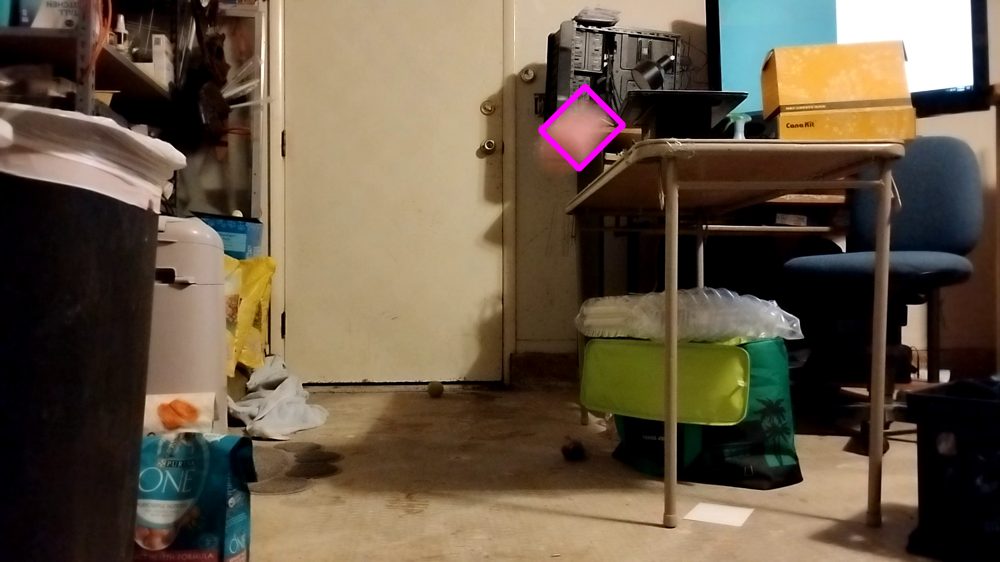

In [58]:
# Find minimum area rectangle, thereby determining the shortest width/theta
box_image=img1.copy()
obj = cv2.minAreaRect(greatest_counter)
print(obj)
points = cv2.boxPoints(obj)
points = np.array([[ [[int(point[0]),int(point[1])]] for point in points]])
box_image = cv2.drawContours(box_image,points,-1,(255,00,255),10)
show(box_image)

In [64]:
def pixels_to_distance(pixels):
  theta = pixels * ( 2 * math.atan(4.25/11) ) / ( 671.0410824679549 )
  r_d = 69 # 69 mm
  d_c = r_d / math.sin( theta / 2 )
  return d_c

In [66]:
#calculate ball diameter in pixels
d_b_pixels = min( obj[1])
print(f"Ball Diameter (pixels): {d_b_pixels}")
print(f"Ball Distance (mm): {pixels_to_distance(d_b_pixels)}")

Ball Diameter (pixels): 103.97151947021484
Ball Distance (mm): 1208.514135796023
